In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB
          longitude      latitude  housing_median_age   total_rooms  \
count  20640.000000  20640.000000        20640.000000  20640.000000   
mean    -119.569704     35.631861           28.639486   2635.763081   
std        2.003532      2.135952     

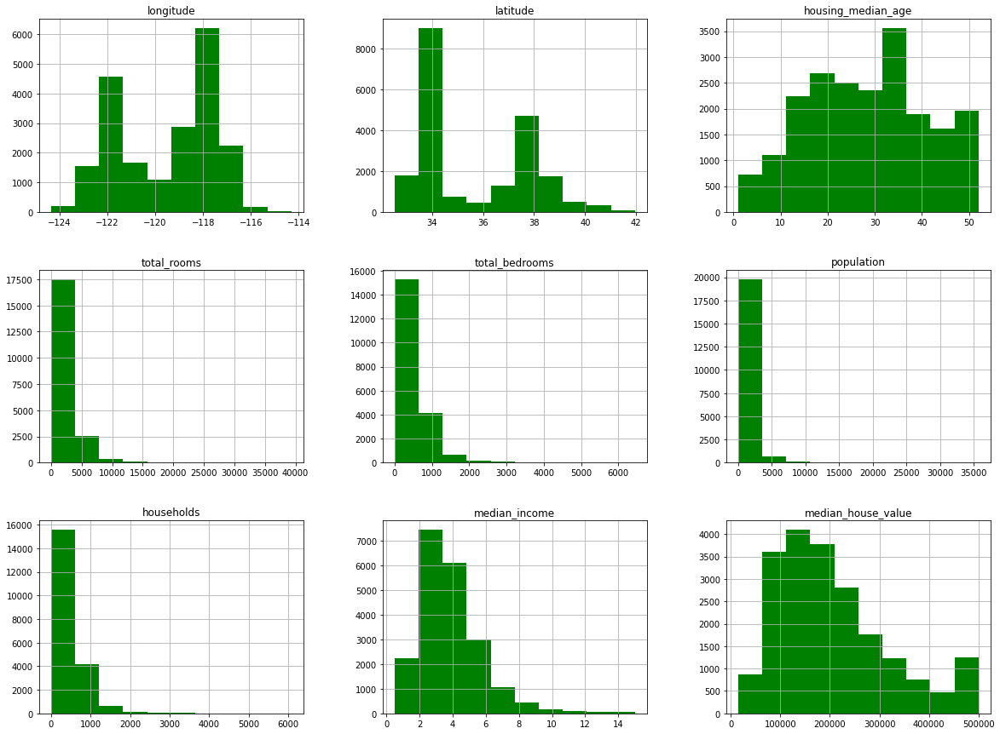

In [37]:
data = pd.read_csv('housing.csv')
data.info()
print(data.describe())
data.head()
data.hist(figsize = (20,15),color = 'green')
plt.show()

In [38]:
#Chech for NULL values
data  = data.dropna(axis = 0)
x_data = data.drop(data.columns[[8,9]], axis = 1)
y_data = data['median_house_value']
housing_median_age = data['housing_median_age']
x_data = x_data[y_data < 500000]
x_data = x_data[housing_median_age < 52]
y_data = y_data[y_data < 500000]
y_data = y_data[housing_median_age < 52]
# print(y_data)

In [39]:
#Train Test split
X_train,X_test,y_train,y_test = train_test_split(x_data,y_data,test_size = 0.2,random_state = 101)

In [40]:
# Normalization
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(data = scaler.transform(X_train), columns = X_train.columns, index = X_train.index)
X_test = pd.DataFrame(data = scaler.transform(X_test), columns = X_test.columns, index = X_test.index)
X_train.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
5977,0.651606,0.166844,0.44,0.179994,0.214031,0.089745,0.217928,0.177487
8064,0.610442,0.137088,0.82,0.045043,0.055564,0.022758,0.048849,0.303451
1326,0.238956,0.582359,0.70,0.068798,0.085054,0.051123,0.089309,0.195666
7413,0.606426,0.150903,0.82,0.050231,0.088158,0.067351,0.091283,0.144232
2367,0.472892,0.443146,0.56,0.049875,0.060531,0.033773,0.065132,0.143046


In [41]:
poly_reg = Pipeline([
    # ('poly',PolynomialFeatures(degree = 2)),
    ('std_scaler',StandardScaler()),
    ('lin_reg',LinearRegression())
])
poly_reg.fit(X_train,y_train)
print(
    poly_reg.score(X_train,y_train),
    poly_reg.score(X_test,y_test)
)

0.610592996695271 0.6079606332661933


In [42]:
y_pred = poly_reg.predict(X_test)
# plt.scatter(y_test[:,1]，y_pred)
print(y_test)

3091     75800.0
5764    208300.0
7501    104600.0
5374    271600.0
2392     85600.0
          ...   
6369    262000.0
1064     78100.0
826     168800.0
4808    130200.0
3367     73500.0
Name: median_house_value, Length: 3673, dtype: float64


3091    0.081484
5764    0.105541
7501    0.105541
5374    0.088002
2392    0.107869
          ...   
6369    0.107714
1064    0.019401
826     0.042216
4808    0.042527
3367    0.021574
Name: total_bedrooms, Length: 3673, dtype: float64


Text(0, 0.5, 'median_house_value')

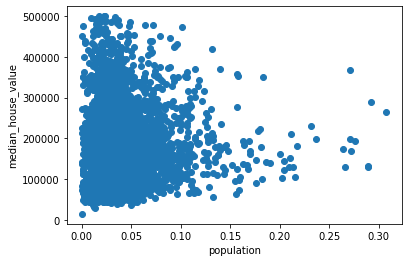

In [46]:
# plt.scatter(X_test[4],y_test)
print(X_test.iloc[:,4])
plt.scatter(X_test.iloc[:,5],y_test)
plt.xlabel('population')
plt.ylabel('median_house_value')

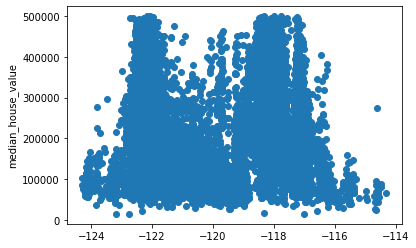

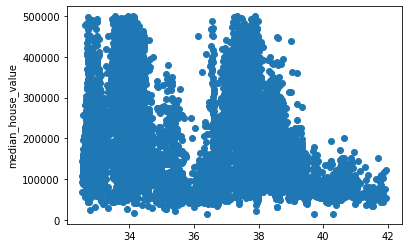

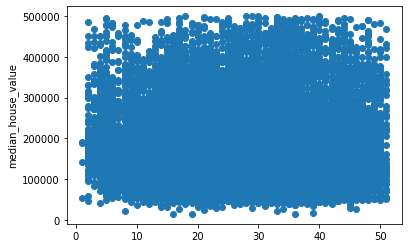

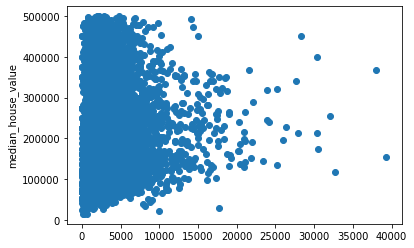

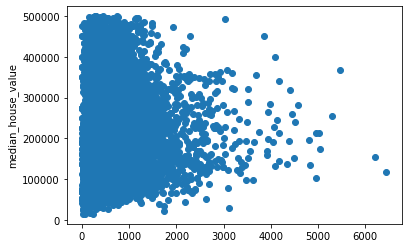

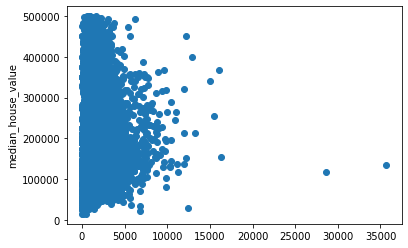

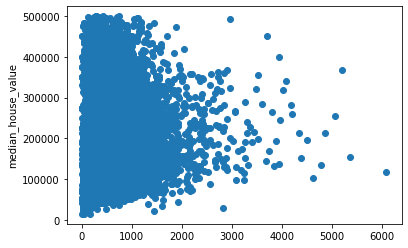

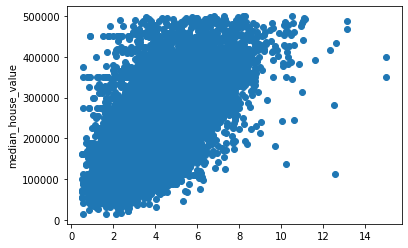

In [47]:
for i in range(8):
    plt.figure()
    plt.scatter(x_data.iloc[:,i],y_data)
    # plt.xlabel('housing_median_age')
    plt.ylabel('median_house_value')

Text(0, 0.5, 'median_house_value')

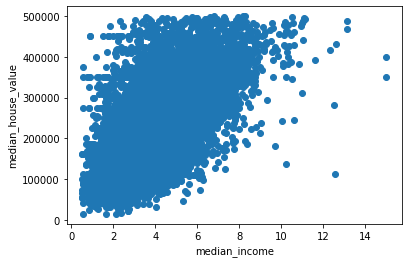

In [49]:
plt.figure()
plt.scatter(x_data.iloc[:,7],y_data)
plt.xlabel('median_income')
plt.ylabel('median_house_value')